<a href="https://colab.research.google.com/github/Evandro72/LDA-Ten-Topics-2/blob/main/LDA_Ten_Topics_ipynb_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
from os import walk
import pandas as pd
import json
import matplotlib.pyplot as plt
import re
import string
import nltk
import datetime
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
pd.set_option("display.max_colwidth", 200)
import numpy as np
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
from nltk.corpus import wordnet

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

#### Read the tweets from the file

In [ ]:
data = pd.read_csv("./Tweets.csv")

In [ ]:
# Replacing Text
data['Tweet'] = data['Tweet'].str.replace('UmbriaJazzOFC','')
data['Tweet'] = data['Tweet'].str.replace('umbriajazz','')
data['Tweet'] = data['Tweet'].str.replace('Umbria Jazz','')
data['Tweet'] = data['Tweet'].str.replace('jazz','')
data['Tweet'] = data['Tweet'].str.replace('Umbria','')
data['Tweet'] = data['Tweet'].str.replace('musica','')
data['Tweet'] = data['Tweet'].str.replace('perugia','')
data['Tweet'] = data['Tweet'].str.replace('Santa Giuliana','')
data['Tweet'] = data['Tweet'].str.replace('Perugia','')
data['Tweet'] = data['Tweet'].str.replace('Umbria','')
data['Tweet'] = data['Tweet'].str.replace('Lady Gaga','')
data['Tweet'] = data['Tweet'].str.replace('UMBRIA','')
data['Tweet'] = data['Tweet'].str.replace('Morlacchi','')
data['Tweet'] = data['Tweet'].str.replace('IV Novembre','')
data['Tweet'] = data['Tweet'].str.replace('Jazz','')
data['Tweet'] = data['Tweet'].str.replace('live','')
data['Tweet'] = data['Tweet'].str.replace('music','')
data['Tweet'] = data['Tweet'].str.replace('italy','')
data['Tweet'] = data['Tweet'].str.replace('luglio','')
data['Tweet'] = data['Tweet'].str.replace('amp','')
data['Tweet'] = data['Tweet'].str.replace('festival','')
data['Tweet'] = data['Tweet'].str.replace('orvieto','')
data['Tweet'] = data['Tweet'].str.replace('umbria','')
data['Tweet'] = data['Tweet'].str.replace('Orvieto','')
data['Tweet'] = data['Tweet'].str.replace('Italy','')
data['Tweet'] = data['Tweet'].str.replace('JAZZ','')
data['Tweet'] = data['Tweet'].str.replace('july','')
data['Tweet'] = data['Tweet'].str.replace('great','')
data['Tweet'] = data['Tweet'].str.replace('night','')
data['Tweet'] = data['Tweet'].str.replace('July','')
data['Tweet'] = data['Tweet'].str.replace('uj','')
data['Tweet'] = data['Tweet'].str.replace('UJ','')
data['Tweet'] = data['Tweet'].str.replace('concerto','')
data['Tweet'] = data['Tweet'].str.replace('UJ','')
data['Tweet'] = data['Tweet'].str.replace('oggi','')
data['Tweet'] = data['Tweet'].str.replace('grande','')
data['Tweet'] = data['Tweet'].str.replace('La','')
data['Tweet'] = data['Tweet'].str.replace('via','')
data['Tweet'] = data['Tweet'].str.replace('palco','')
data['Tweet'] = data['Tweet'].str.replace('grazie','')

In [ ]:
tweets = data[data["Language"]=="English"]["Tweet"].tolist()

In [ ]:
len(tweets)

6323

### Preprocessing

In [ ]:
def removeInputPattern(pattern, inputString):
    inputString=re.sub(pattern,"",inputString)
    return inputString 

In [ ]:
cleaned_tweets=[]
for line in tweets:
    cleaned_tweets.append(removeInputPattern(r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+|@[\w]+",str(line)))

#### Remove Stop Words

In [ ]:
listStopwords = nltk.corpus.stopwords.words("english")

In [ ]:
def removeStopWords(text,listStopwords=listStopwords):
    listText = text.split()
    if listStopwords is not None:
        listText = [word for word in listText if word not in listStopwords]
        
    text = " ".join(listText)
    return text
    

In [ ]:
cleaned_tweets = map(removeStopWords,cleaned_tweets)
cleaned_tweets = list(cleaned_tweets)

In [ ]:
# Remove Emails
cleaned_tweets = [re.sub('\S*@\S*\s?', '', sent) for sent in cleaned_tweets]

# Remove new line characters
cleaned_tweets = [re.sub('\s+', ' ', sent) for sent in cleaned_tweets]

# Remove distracting single quotes
cleaned_tweets = [re.sub("\'", "", sent) for sent in cleaned_tweets]

#### Tokenize each tweet and remove punctuations

In [ ]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(cleaned_tweets))
data_words = [words for words in data_words if len(words)>0]
print(data_words[:1])

[['in', 'love', 'weekend', 'see']]


 #### Build Bigram and Trigram Models

In [ ]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)


In [ ]:
import spacy

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

run this to download en model from spacy  
!python3 -m spacy download en

In [ ]:
# Create Bigrams o
data_words_bigrams = make_bigrams(data_words)

# Initialize the spacy 'en' model for lemmatization purpose, keeping only tagger component (for efficiency)
nlp = spacy.load("en_core_web_sm",disable=['parser', 'ner'])

# Perform lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

[['love', 'weekend', 'see']]


### Topic Modelling

In [ ]:
# The two important inputs to the LDA topic model are the dictionary(id2word) and the corpus. So, let’s create them.
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])



[[(0, 1), (1, 1), (2, 1)]]


In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=400,
                                           passes=20,
                                           alpha='auto',
                                           per_word_topics=True)

In [ ]:
for each_topic in lda_model.print_topics():
    print(each_topic)
    print("\n")

(0, '0.068*"trio" + 0.064*"ticket" + 0.061*"arena" + 0.032*"stay_human" + 0.020*"happy" + 0.018*"buy" + 0.015*"news" + 0.014*"hot" + 0.013*"app" + 0.012*"programme"')


(1, '0.084*"winter" + 0.055*"good" + 0.037*"live" + 0.031*"music" + 0.025*"here" + 0.021*"enjoy" + 0.019*"friend" + 0.019*"orchestra" + 0.019*"ste" + 0.018*"rock"')


(2, '0.040*"time" + 0.036*"wait" + 0.028*"travel" + 0.028*"follow" + 0.021*"m" + 0.020*"visit" + 0.020*"album" + 0.019*"f" + 0.017*"blue" + 0.017*"first"')


(3, '0.069*"concert" + 0.032*"pm" + 0.029*"photo" + 0.026*"people" + 0.025*"italian" + 0.020*"make" + 0.020*"funk_off" + 0.019*"artist" + 0.018*"story" + 0.015*"tonight"')


(4, '0.070*"see" + 0.047*"play" + 0.041*"go" + 0.026*"last" + 0.026*"take" + 0.024*"cant_wait" + 0.020*"back" + 0.020*"week" + 0.014*"big" + 0.014*"sonny_rollin"')


(5, '0.046*"year" + 0.044*"new" + 0.037*"check" + 0.028*"sound" + 0.016*"info" + 0.015*"night" + 0.015*"world" + 0.014*"luglio" + 0.014*"book" + 0.014*"food"')


(6, 

In [ ]:
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5906424633410932


In [ ]:
list_tweets = [" ".join(words) for words in data_words]

In [ ]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row[0], key=lambda x: x[1], reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                #print(topic_keywords)
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=list_tweets)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,6.0,0.2171,"thank, today, love, summer, get, start, now, place, wonderful, much",in love weekend see
1,1,2.0,0.2688,"time, wait, travel, follow, m, visit, album, f, blue, first",what weekend
2,2,6.0,0.1273,"thank, today, love, summer, get, start, now, place, wonderful, much",terni back town terni
3,3,6.0,0.1275,"thank, today, love, summer, get, start, now, place, wonderful, much",palco terni ben fatto
4,4,6.0,0.1273,"thank, today, love, summer, get, start, now, place, wonderful, much",ramseylewis ph giancarlo belfiore
5,5,1.0,0.5750,"winter, good, live, music, here, enjoy, friend, orchestra, ste, rock",club weekend scopri il programma completo dei club di weekend entrata gratuita
6,6,0.0,0.4182,"trio, ticket, arena, stay_human, happy, buy, news, hot, app, programme",happy birthday maestro tanti auguri family
7,7,0.0,0.4875,"trio, ticket, arena, stay_human, happy, buy, news, hot, app, programme",𝗥𝗼𝗮𝗱 𝘁𝗼 𝘂𝗷𝘄𝗲𝗲𝗸𝗲𝗻𝗱 anfiteatro romano quartet we wonder tickets
8,8,0.0,0.5369,"trio, ticket, arena, stay_human, happy, buy, news, hot, app, programme",𝗥𝗼𝗮𝗱 𝘁𝗼 𝘂𝗷𝘄𝗲𝗲𝗸𝗲𝗻𝗱 anfiteatro romano romantic tour tickets
9,9,6.0,0.5295,"thank, today, love, summer, get, start, now, place, wonderful, much",my name alison singer thanks excellencies pleasure let discover beauties land rich villages extraordinary places excellencies tourism model


In [ ]:
df_dominant_topic.to_excel("LDA results Ten Topics.xlsx",index=False)

In [ ]:
keywords_groupby = df_dominant_topic.groupby("Keywords").count().sort_values(by="Topic_Perc_Contrib").reset_index()
group_by_data = df_dominant_topic.groupby("Dominant_Topic").count().sort_values(by="Topic_Perc_Contrib").reset_index()
group_by_data = group_by_data.rename({"Document_No":"Topic Count","Dominant_Topic":"Topic"}, axis=1)

In [ ]:
group_by_data["keywords"] = keywords_groupby["Keywords"]
group_by_data["Topic"] = group_by_data["Topic"].apply(lambda x: str(int(x+1)))

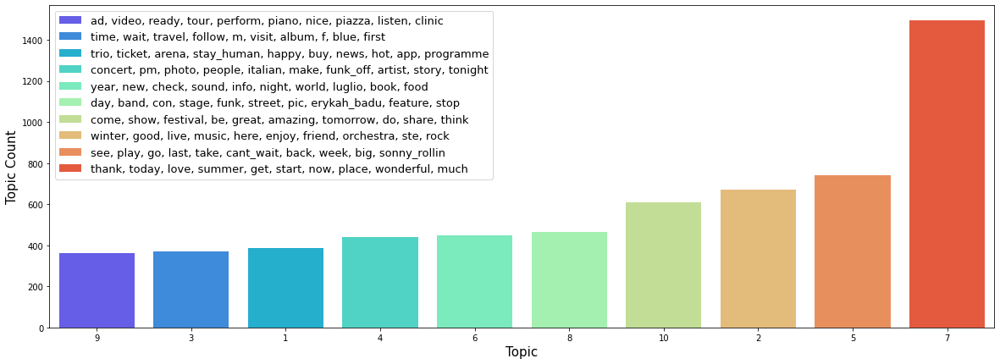

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

topics_num = group_by_data["Topic"].tolist()

plt.subplots(figsize=(20,7))
sns.barplot(x = "Topic", y = "Topic Count", palette = 'rainbow',hue="keywords" ,data = group_by_data, dodge = False)
plt.xlabel("Topic",size=15)
plt.ylabel("Topic Count",size=15)
plt.legend(fontsize=13)
plt.show()

In [ ]:
# Define a function to plot word cloud
from wordcloud import WordCloud, STOPWORDS
def plot_cloud(text):
    wordcloud = WordCloud(width= 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(text)
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

#### Merging Tweet Text based on Topics

In [ ]:
topic_one_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==0]["Text"].tolist())
topic_two_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==1]["Text"].tolist())
topic_three_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==2]["Text"].tolist())
topic_four_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==3]["Text"].tolist())
topic_five_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==4]["Text"].tolist())
topic_six_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==5]["Text"].tolist())
topic_seven_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==6]["Text"].tolist())
topic_eight_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==7]["Text"].tolist())
topic_nine_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==8]["Text"].tolist())
topic_ten_text = "".join(df_dominant_topic[df_dominant_topic["Dominant_Topic"]==9]["Text"].tolist())

### Generating WordCloud from the tweets based on the topics

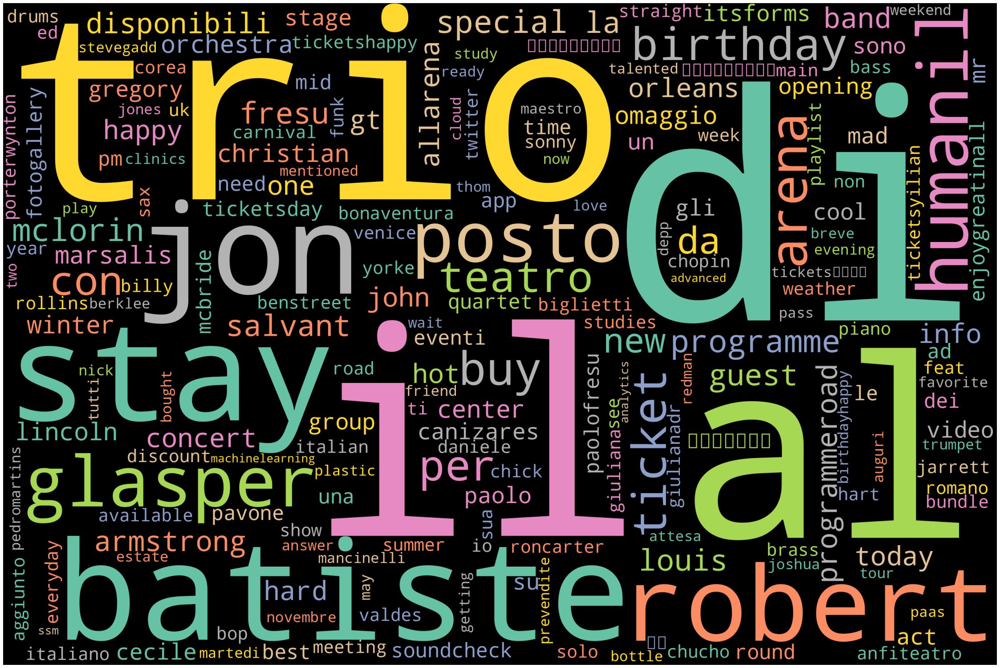

In [ ]:
plot_cloud(topic_one_text)

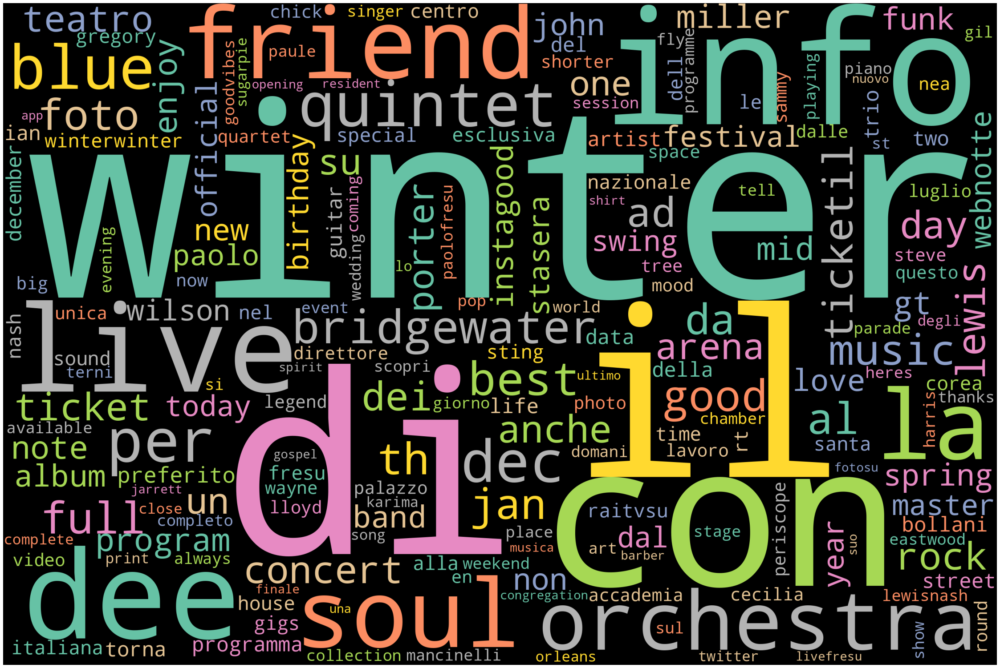

In [ ]:
plot_cloud(topic_two_text)

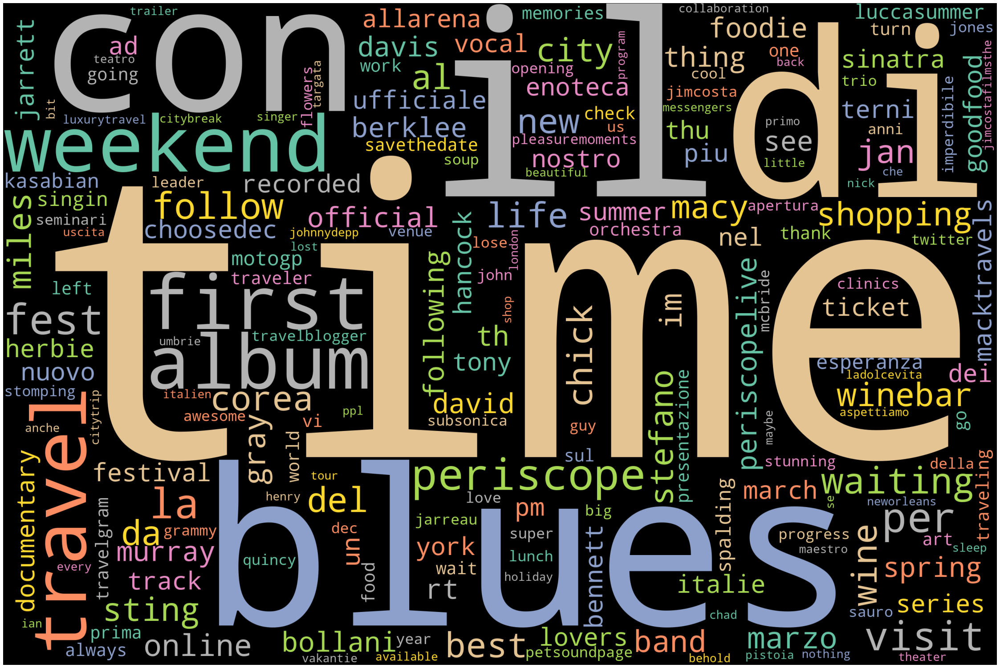

In [ ]:
plot_cloud(topic_three_text)

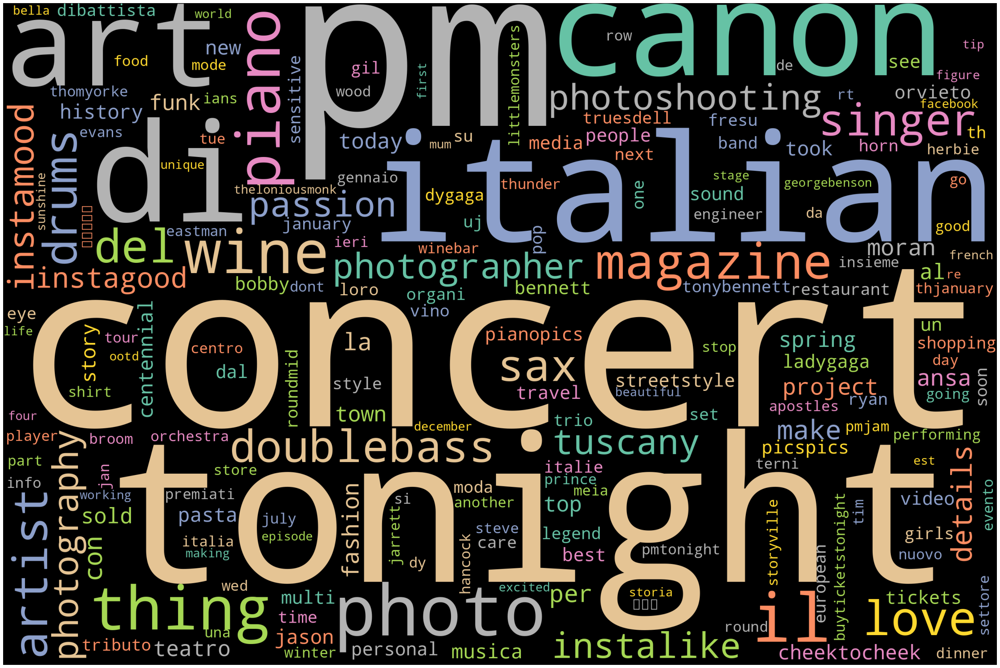

In [ ]:
plot_cloud(topic_four_text)

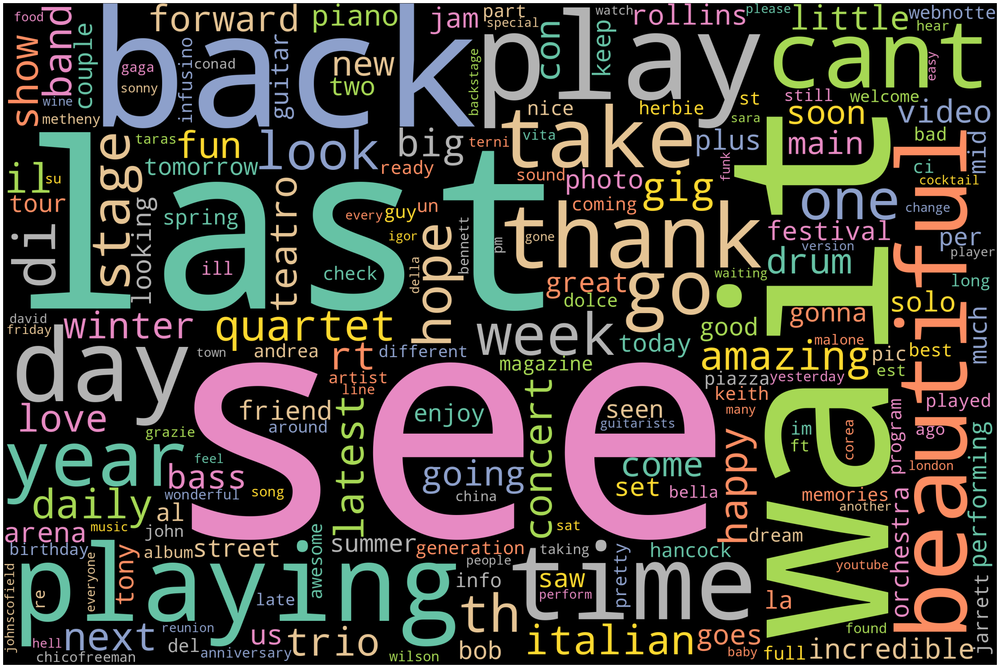

In [ ]:
plot_cloud(topic_five_text)

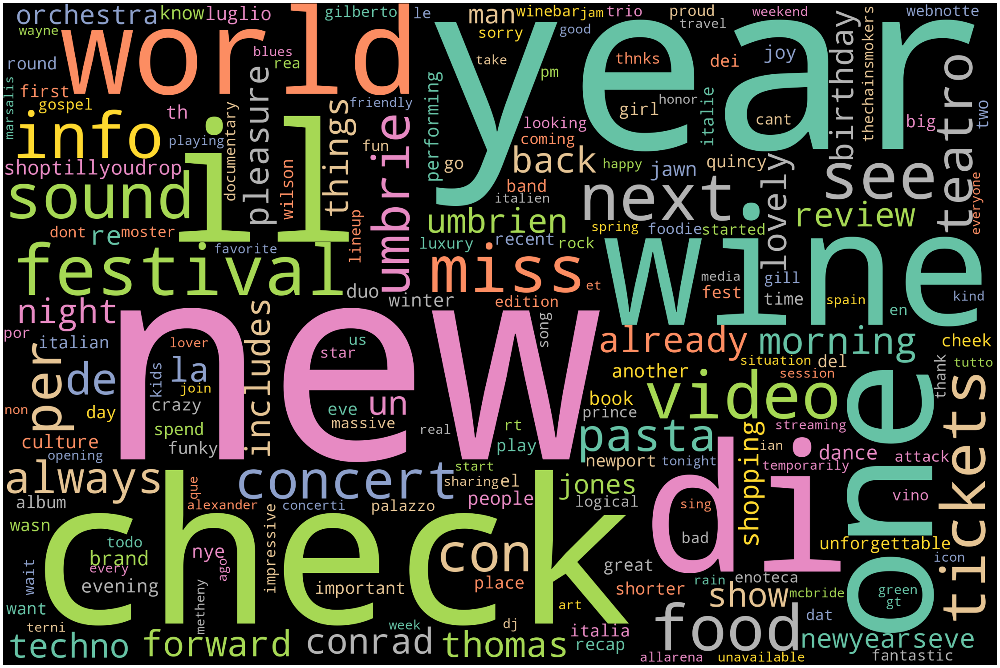

In [ ]:
plot_cloud(topic_six_text)

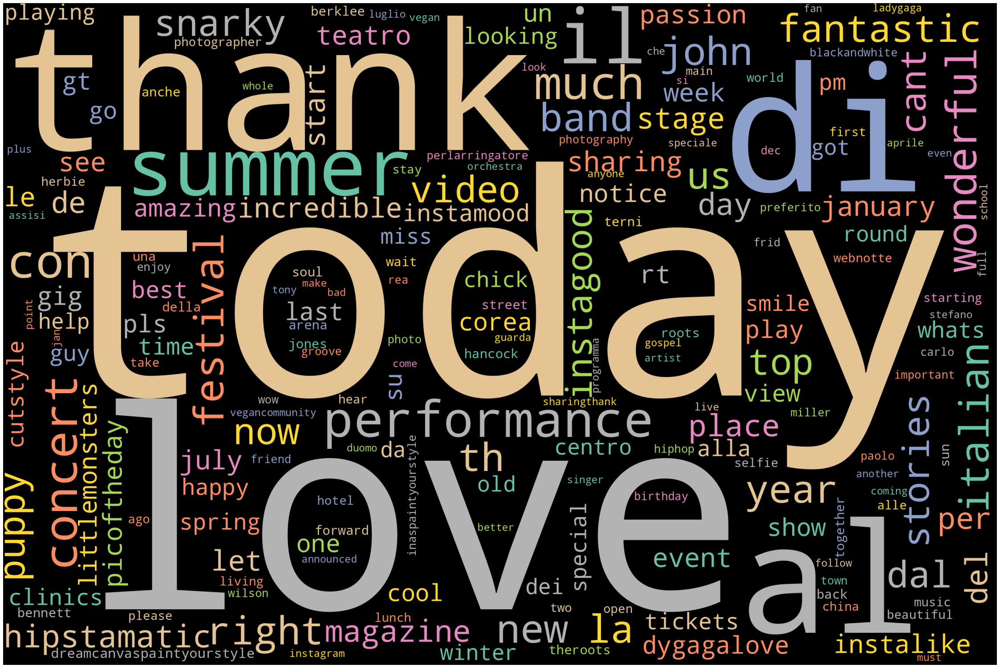

In [ ]:
plot_cloud(topic_seven_text)

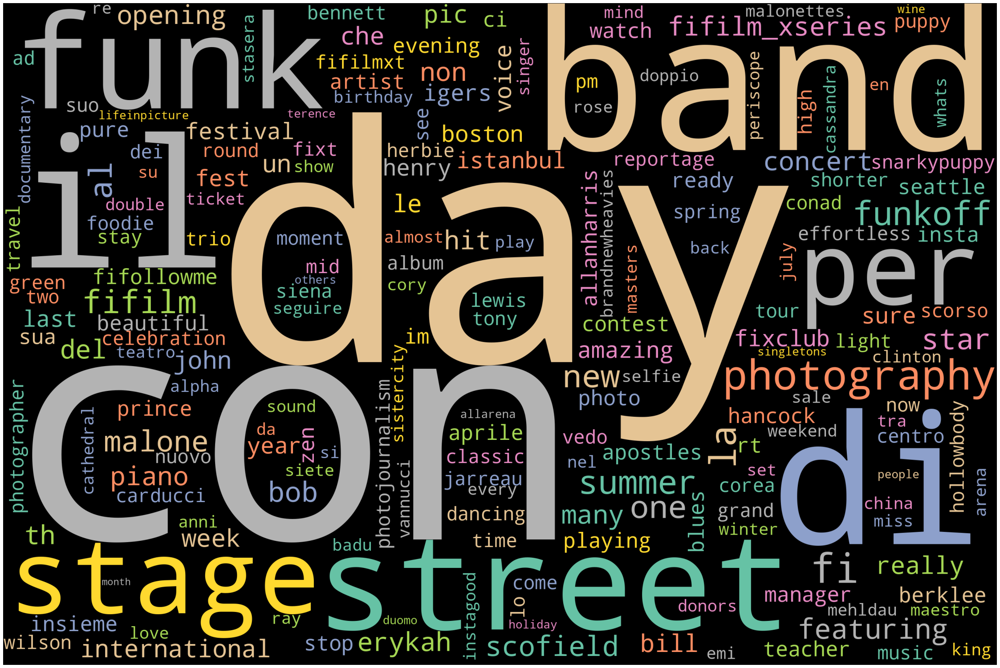

In [ ]:
plot_cloud(topic_eight_text)

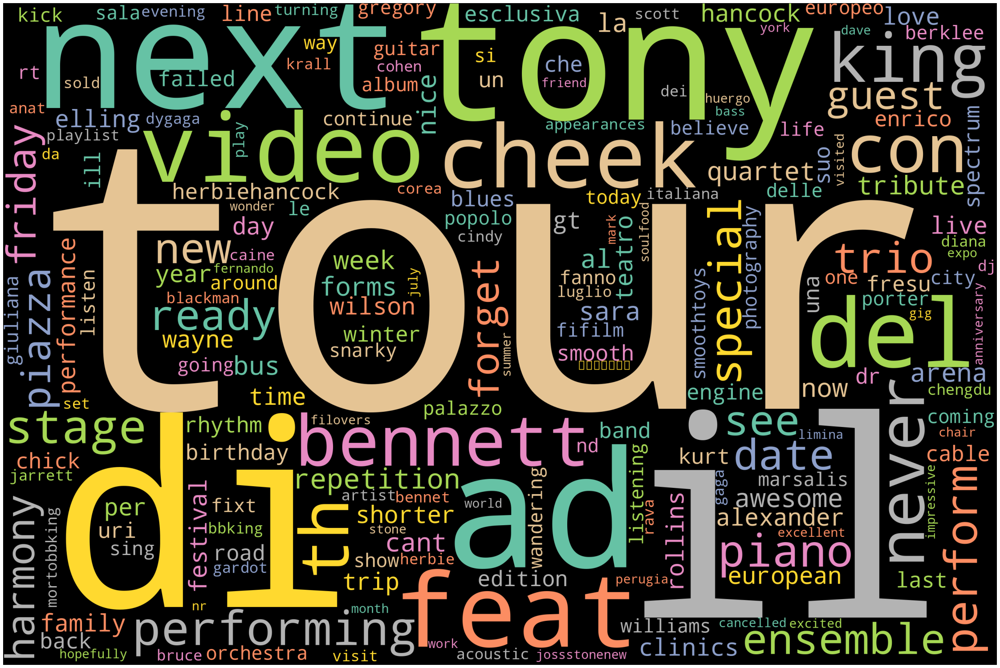

In [ ]:
plot_cloud(topic_nine_text)

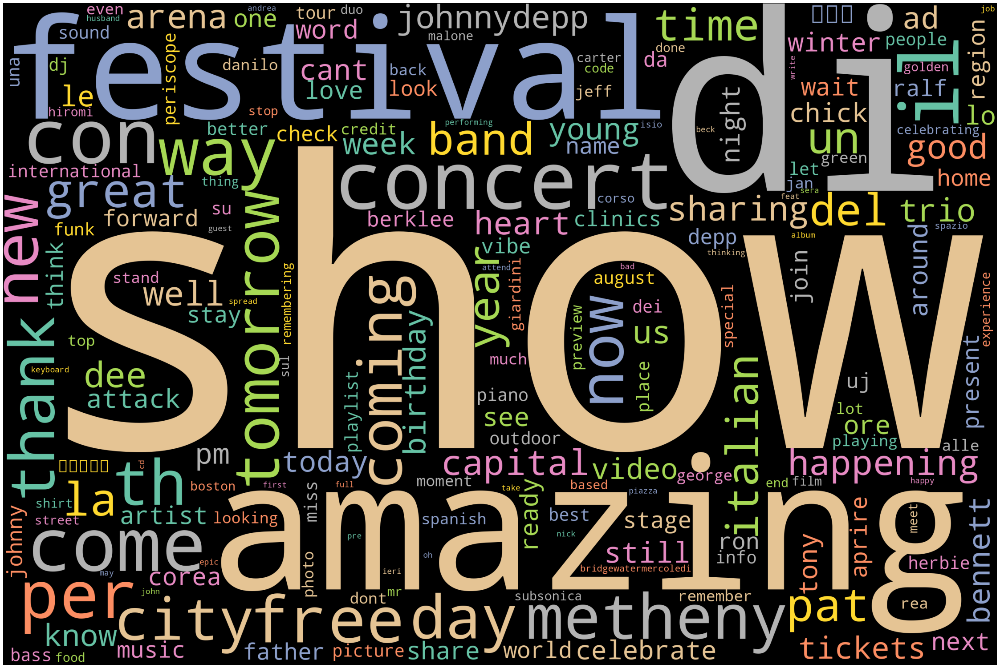

In [ ]:
plot_cloud(topic_ten_text)